# Stumpy Test

Play with stumpy.

In this notebook I'm testing motif discovery around economic events. Specifically, I'm looking at the start and end dates of stock market drawdowns associated with recessions.

**Author:** shittles

**Created:** 2024-09-24

**Modified:** 2024-09-25

## Changelog


In [44]:
import stumpy
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

from vectorbtpro import *

In [45]:
vbt.settings.set_theme("dark")

## US Stock Market

### Ingestion


In [46]:
data = vbt.YFData.pull(
    ["^GSPC", "^VIX", "^VVIX"],
    start="50 years ago",
    end="today",
    timeframe="daily",
    tz="UTC",
    missing_columns="drop",
)

data.stats()

  0%|          | 0/3 [00:00<?, ?it/s]

/Users/davidbrazda/Documents/Development/python/strategy-lab1/.venv/lib/python3.10/site-packages/vectorbtpro/data/base.py:1778: UserWarning:

Symbols have mismatching index. Setting missing data points to NaN.



Start                 1974-09-27 04:00:00+00:00
End                   2024-09-25 05:00:00+00:00
Period                      21357 days 00:00:00
Total Symbols                                 3
Null Counts: ^GSPC                        61250
Null Counts: ^VIX                         88249
Null Counts: ^VVIX                       118321
Name: agg_stats, dtype: object

In [47]:
data.data["^GSPC"]

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
1974-09-27 04:00:00+00:00,0.000000,67.089996,64.580002,64.940002,1.232000e+07,0.0,0.0
1974-09-30 04:00:00+00:00,0.000000,64.849998,62.520000,63.540001,1.500000e+07,0.0,0.0
1974-10-01 04:00:00+00:00,0.000000,64.370003,61.750000,63.389999,1.689000e+07,0.0,0.0
1974-10-02 04:00:00+00:00,0.000000,64.620003,62.740002,63.380001,1.223000e+07,0.0,0.0
1974-10-03 04:00:00+00:00,0.000000,63.480000,61.660000,62.279999,1.315000e+07,0.0,0.0
...,...,...,...,...,...,...,...
2024-09-23 05:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-24 04:00:00+00:00,5727.660156,5735.319824,5698.990234,5732.930176,3.872710e+09,0.0,0.0
2024-09-24 05:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
data.index

DatetimeIndex(['1974-09-27 04:00:00+00:00', '1974-09-30 04:00:00+00:00',
               '1974-10-01 04:00:00+00:00', '1974-10-02 04:00:00+00:00',
               '1974-10-03 04:00:00+00:00', '1974-10-04 04:00:00+00:00',
               '1974-10-07 04:00:00+00:00', '1974-10-08 04:00:00+00:00',
               '1974-10-09 04:00:00+00:00', '1974-10-10 04:00:00+00:00',
               ...
               '2024-09-19 04:00:00+00:00', '2024-09-19 05:00:00+00:00',
               '2024-09-20 04:00:00+00:00', '2024-09-20 05:00:00+00:00',
               '2024-09-23 04:00:00+00:00', '2024-09-23 05:00:00+00:00',
               '2024-09-24 04:00:00+00:00', '2024-09-24 05:00:00+00:00',
               '2024-09-25 04:00:00+00:00', '2024-09-25 05:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Date', length=21357, freq=None)

In [49]:
# The opens are corrupt...
data.plot(symbol="^GSPC", yaxis=dict(type="log")).show()

In [50]:
# but the closes are fine.
data.data["^GSPC"]["Close"].vbt.plot(yaxis=dict(type="log")).show()

### Cleaning


In [51]:
data.features

['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits']

In [52]:
data.get_feature("Volume").any(axis=1).all()

False

In [53]:
data.get_feature("Dividends").any(axis=1).all()

False

In [54]:
data.get_feature("Stock Splits").any(axis=1).all()

False

In [55]:
data = data.remove_features(["Volume", "Dividends", "Stock Splits"])

In [56]:
data = data.resample("daily")

<Axes: xlabel='Date'>

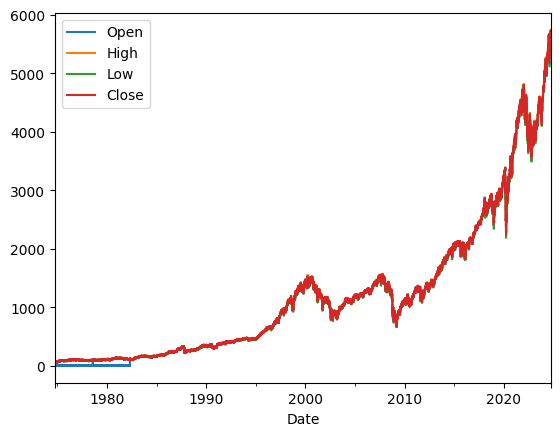

In [57]:
# data = data.transform(lambda df: df.loc["April 19th 1982" < df.index])
data.data["^GSPC"].plot()

## US Recession Dates

File downloaded from FRED as CSV.

- https://www.nber.org/research/data/us-business-cycle-expansions-and-contractions
- https://fred.stlouisfed.org/series/USREC

### Ingestion


In [58]:
df_usrec = pd.read_csv("USREC.csv")

df_usrec

,DATE,USREC
0,1854-12-01,1
1,1855-01-01,0
2,1855-02-01,0
3,1855-03-01,0
4,1855-04-01,0
...,...,...
2032,2024-04-01,0
2033,2024-05-01,0
2034,2024-06-01,0
2035,2024-07-01,0


### Cleaning


In [59]:
df_usrec = df_usrec.rename(columns={"DATE": "Date"})

df_usrec["Date"] = pd.to_datetime(df_usrec["Date"], utc=True)

df_usrec = df_usrec.set_index("Date")

In [60]:
df_usrec

,USREC
Date,
1854-12-01 00:00:00+00:00,1
1855-01-01 00:00:00+00:00,0
1855-02-01 00:00:00+00:00,0
1855-03-01 00:00:00+00:00,0
1855-04-01 00:00:00+00:00,0
...,...
2024-04-01 00:00:00+00:00,0
2024-05-01 00:00:00+00:00,0
2024-06-01 00:00:00+00:00,0


In [61]:
# Increment the id when the recession state goes from zero to one.
df_usrec["Recession ID"] = (
    (df_usrec["USREC"] == 1) & (df_usrec["USREC"] != df_usrec["USREC"].shift())
).cumsum()

# Set the id to nan when the recession state is zero.
df_usrec.loc[df_usrec["USREC"] == 0, "Recession ID"] = np.nan

df_usrec

,USREC,Recession ID
Date,,
1854-12-01 00:00:00+00:00,1,1.0
1855-01-01 00:00:00+00:00,0,NaN
1855-02-01 00:00:00+00:00,0,NaN
1855-03-01 00:00:00+00:00,0,NaN
1855-04-01 00:00:00+00:00,0,NaN
...,...,...
2024-04-01 00:00:00+00:00,0,NaN
2024-05-01 00:00:00+00:00,0,NaN
2024-06-01 00:00:00+00:00,0,NaN


### Analysis


In [67]:
df_usrec_stats = (
    df_usrec.reset_index()
    .groupby("Recession ID")
    .agg(
        **{
            "Start Date": ("Date", "first"),
            "End Date": ("Date", "last"),
        }
    )
)

df_usrec_stats

,Start Date,End Date
Recession ID,,
1.0,1854-12-01 00:00:00+00:00,1854-12-01 00:00:00+00:00
2.0,1857-07-01 00:00:00+00:00,1858-12-01 00:00:00+00:00
3.0,1860-11-01 00:00:00+00:00,1861-06-01 00:00:00+00:00
4.0,1865-05-01 00:00:00+00:00,1867-12-01 00:00:00+00:00
5.0,1869-07-01 00:00:00+00:00,1870-12-01 00:00:00+00:00
6.0,1873-11-01 00:00:00+00:00,1879-03-01 00:00:00+00:00
7.0,1882-04-01 00:00:00+00:00,1885-05-01 00:00:00+00:00
8.0,1887-04-01 00:00:00+00:00,1888-04-01 00:00:00+00:00
9.0,1890-08-01 00:00:00+00:00,1891-05-01 00:00:00+00:00


In [68]:
def plot_recessions(fig, data, df_usrec_stats):
    """Plot recessions as vertical rectangles."""
    for index, row in df_usrec_stats.iterrows():
        if data.index[0] < row["End Date"]:
            if row["End Date"] < data.index[-1]:
                # Clip recessions that started before the data.
                if row["Start Date"] < data.index[0]:
                    row["Start Date"] = data.index[0]

                fig.add_vrect(
                    x0=row["Start Date"],
                    x1=row["End Date"],
                    fillcolor="grey",
                    opacity=0.2,
                    line_width=0,
                )

    return fig

In [69]:
fig = vbt.make_figure()

data.data["^GSPC"]["Close"].vbt.plot(yaxis=dict(type="log"), fig=fig)

fig = plot_recessions(fig, data, df_usrec_stats)

fig.update_layout(
    title="NBER Recession Dates",
    xaxis_title="Date",
    yaxis_title="Log Close",
    showlegend=True,
)

fig.show()

## US Stock Market Drawdowns Associated with Recessions

**Goal:** Find the drawdowns associated with US recessions.

**Reasoning:** I want to avoid large drawdowns. In a perfect world you could forecast all of them, but in reality no-one seems to be able to do so. I think recessions are a subset of crashes that're caused by the "real" economy deteriorating, so there should be warning signals in advance of the crash.


In [91]:
sr_gspc_open = data.get_feature("Open")["^GSPC"]
sr_gspc_high = data.get_feature("High")["^GSPC"]
sr_gspc_low = data.get_feature("Low")["^GSPC"]
sr_gspc_close = data.get_feature("Close")["^GSPC"]

sr_gspc_open

Date
1974-09-27 00:00:00+00:00       0.000000
1974-09-28 00:00:00+00:00            NaN
1974-09-29 00:00:00+00:00            NaN
1974-09-30 00:00:00+00:00       0.000000
1974-10-01 00:00:00+00:00       0.000000
                                ...     
2024-09-21 00:00:00+00:00            NaN
2024-09-22 00:00:00+00:00            NaN
2024-09-23 00:00:00+00:00    5711.899902
2024-09-24 00:00:00+00:00    5727.660156
2024-09-25 00:00:00+00:00    5733.649902
Freq: D, Name: ^GSPC, Length: 18262, dtype: float64

In [92]:
# to sr_gspc_open dataframe add column with weekday of sr_gspc_open.index.dayofweek but keep index only Date

sr_gspc_open = sr_gspc_open.to_frame("Open").assign(weekday=sr_gspc_open.index.dayofweek)


In [93]:
sr_gspc_open

,Open,weekday
Date,,
1974-09-27 00:00:00+00:00,0.000000,4
1974-09-28 00:00:00+00:00,NaN,5
1974-09-29 00:00:00+00:00,NaN,6
1974-09-30 00:00:00+00:00,0.000000,0
1974-10-01 00:00:00+00:00,0.000000,1
...,...,...
2024-09-21 00:00:00+00:00,NaN,5
2024-09-22 00:00:00+00:00,NaN,6
2024-09-23 00:00:00+00:00,5711.899902,0


In [98]:
sr_gspc_open_agg = (
    sr_gspc_open.reset_index()
    .groupby("weekday")
    .agg(
        **{
            "Start Date": ("Date", "first"),
            "End Date": ("Date", "last"),
            "First value": ("Open", "first"),
            "Last value": ("Open", "last"),
            "Avg value": ("Open", "mean"),
        }
    )
)

sr_gspc_open_agg

,Start Date,End Date,First value,Last value,Avg value
weekday,,,,,
0,1974-09-30 00:00:00+00:00,2024-09-23 00:00:00+00:00,0.0,5711.899902,1173.832593
1,1974-10-01 00:00:00+00:00,2024-09-24 00:00:00+00:00,0.0,5727.660156,1190.857564
2,1974-10-02 00:00:00+00:00,2024-09-25 00:00:00+00:00,0.0,5733.649902,1189.595689
3,1974-10-03 00:00:00+00:00,2024-09-19 00:00:00+00:00,0.0,5702.629883,1190.946251
4,1974-09-27 00:00:00+00:00,2024-09-20 00:00:00+00:00,0.0,5709.640137,1189.769876
5,1974-09-28 00:00:00+00:00,2024-09-21 00:00:00+00:00,NaN,NaN,NaN
6,1974-09-29 00:00:00+00:00,2024-09-22 00:00:00+00:00,NaN,NaN,NaN


In [30]:
pf = vbt.Portfolio.from_holding(close=sr_gspc_close)

pf.stats()

Start                         1974-09-26 00:00:00+00:00
End                           2024-09-24 00:00:00+00:00
Period                              18262 days 00:00:00
Start Value                                       100.0
Min Value                                     93.710502
Max Value                                   8626.136405
End Value                                   8626.136405
Total Return [%]                            8526.136405
Benchmark Return [%]                        8526.136405
Total Time Exposure [%]                           100.0
Max Gross Exposure [%]                            100.0
Max Drawdown [%]                              56.775388
Max Drawdown Duration                2621 days 00:00:00
Total Orders                                          1
Total Fees Paid                                     0.0
Total Trades                                          1
Win Rate [%]                                        NaN
Best Trade [%]                                  

In [31]:
pf.plot(yaxis=dict(type="log")).show()

In [32]:
fig = vbt.make_figure()

pf.drawdowns.plot(yaxis=dict(type="log"), fig=fig)

fig = plot_recessions(fig, data, df_usrec_stats)

fig.show()

In [99]:
fig = vbt.make_figure()

pf.plot_underwater(pct_scale=True, fig=fig)

fig = plot_recessions(fig, data, df_usrec_stats)

fig.show()

In [100]:
df_drawdowns = (
    pd.merge(
        pf.drawdowns.readable,
        pf.drawdowns.drawdown.readable["Value"],
        left_index=True,
        right_index=True,
    )
    .set_index("Drawdown Id")
    .sort_values("Value")
)

AttributeError: 'Drawdowns' object has no attribute 'readable'

In [37]:
df_drawdowns["Valley Length"] = (
    df_drawdowns["Valley Index"] - df_drawdowns["Start Index"]
)
df_drawdowns["Recovery Length"] = (
    df_drawdowns["End Index"] - df_drawdowns["Valley Index"]
)
df_drawdowns["Total Length"] = df_drawdowns["End Index"] - df_drawdowns["Start Index"]

df_drawdowns

NameError: name 'df_drawdowns' is not defined

In [38]:
# Prices generally rise slowly (with low volatility), but fall quickly (with high volatility)
px.scatter(df_drawdowns, "Valley Length", "Recovery Length", "Value")

NameError: name 'df_drawdowns' is not defined

In [40]:
# An overlap occured if the start or end of one period is between the start and end of another.
overlaps = []

for idx_recession, row_recession in df_usrec_stats.iterrows():
    for idx_drawdown, row_drawdown in df_drawdowns.iterrows():
        if (row_drawdown["Start Index"] <= row_recession["End Date"]) & (
            row_drawdown["End Index"] >= row_recession["Start Date"]
        ):
            overlaps.append(
                (
                    idx_recession,
                    idx_drawdown,
                    row_recession["Start Date"],
                    row_recession["End Date"],
                    row_drawdown["Start Index"],
                    row_drawdown["End Index"],
                )
            )

df_overlaps = pd.DataFrame(
    overlaps,
    columns=[
        "Recession ID",
        "Drawdown ID",
        "Recession Start Date",
        "Recession End Date",
        "Drawdown Start Date",
        "Drawdown End Date",
    ],
).sort_values(["Recession Start Date", "Drawdown Start Date"])

df_overlaps

NameError: name 'df_drawdowns' is not defined

## An Experiment

If you could perfectly time the top 5 crashes (or recessions) in the last 50 years, what would your returns be?

If you want to beat the index, then a good place to start is with the index. Just like a baseball player, **you don't have to swing at every pitch**. That is, you can choose to trade only when you know something with certainty. **You don't have to play.** You can simply buy the index and make a few high conviction trades a year.

What's more, if you restrict yourself to only high quality ideas, then you uncover a special case. If you think you know what the price is going to be and when, then you know how to structure the trade to maximise your profit.


In [ ]:
# df_top_drawdowns = df_drawdowns[:5]  # crashes
df_top_drawdowns = df_drawdowns[df_drawdowns.index.isin(df_overlaps["Drawdown ID"])][
    :5
]  # recessions

df_top_drawdowns

In [ ]:
perfect_exits = data.index.isin(df_top_drawdowns["Start Index"])
perfect_entries = data.index.isin(df_top_drawdowns["Valley Index"])

perfect_entries[0] = True

perfect_entries

In [32]:
pf = vbt.Portfolio.from_signals(
    # to eliminate weekends
    close=sr_gspc_close.ffill().bfill(),
    entries=perfect_entries,
    exits=perfect_exits,
    direction="both",
    fees=0.001,
    size=1.0,
    size_type=vbt.pf_enums.SizeType.ValuePercent,
)

In [ ]:
pf.plot(yaxis=dict(type="log")).show()

In [ ]:
pf.drawdowns.plot(yaxis=dict(type="log")).show()

In [ ]:
pf.plot_underwater(pct_scale=True).show()

## US Unemployment Rate

File downloaded from FRED as CSV.

- https://www.bls.gov
- https://fred.stlouisfed.org/series/UNRATE

### Ingestion


In [ ]:
df_unrate = pd.read_csv("data/raw/fred/UNRATE.csv")

df_unrate

### Cleaning


In [ ]:
df_unrate = df_unrate.rename(columns={"DATE": "Date"})

df_unrate["Date"] = pd.to_datetime(df_unrate["Date"], utc=True)

df_unrate = df_unrate.set_index("Date")

df_unrate

### Analysis

Let's see if I can get stumpy to identify the unemployment rate spiking.


In [ ]:
fig = vbt.make_figure()

fig = plot_recessions(fig, df_unrate, df_usrec_stats)

df_unrate.vbt.plot(fig=fig).show()

#### Compute the Pan Matrix Profile

- https://github.com/TDAmeritrade/stumpy/blob/05cfc5218c8b0a5bc2c774832c5cfe0199e74e34/docs/Tutorial_Pan_Matrix_Profile.ipynb


In [ ]:
df_unrate

In [40]:
max_m = 60
min_m = 1

# The percentage of the full matrix profile to compute for each subsequence window size (the extent of `stumpy.scrump` completion).
percentage = 1

pan_matrix_profile = stumpy.stimp(
    df_unrate["UNRATE"], min_m=min_m, max_m=max_m, percentage=percentage
)

n = np.ceil((max_m - min_m) * percentage).astype(int)

for _ in range(n):
    pan_matrix_profile.update()

In [41]:
fig = vbt.make_figure()

fig.add_trace(go.Heatmap(
    z=pan_matrix_profile.PAN_,
    colorscale='Greys',
    zmin=0.0,
    zmax=1.0,
    reversescale=True,
))

fig.update_layout(
    title_text="Pan Matrix Profile",
    xaxis=dict(title="Date"),
    yaxis=dict(title="m"),
)

fig.show()

NameError: name 'pan_matrix_profile' is not defined

#### Compute the Matrix Profile

- https://stumpy.readthedocs.io/en/latest/Tutorial_STUMPY_Basics.html


In [42]:
m = 60

mp = stumpy.stump(df_unrate["UNRATE"], m)

NameError: name 'df_unrate' is not defined

In [43]:
motif_idx = np.argsort(mp[:, 0])[0]

print(f"The motif is located at index {motif_idx}")

NameError: name 'mp' is not defined

In [ ]:
nearest_neighbor_idx = mp[motif_idx, 1]

print(f"The nearest neighbor is located at index {nearest_neighbor_idx}")

In [ ]:
fig = vbt.make_subplots(
    rows=2,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.02,
    subplot_titles=["UNRATE", "Matrix Profile"],
)

# Plot the US unemployment rate:
fig.add_trace(
    go.Scatter(
        x=df_unrate.index, y=df_unrate["UNRATE"].values, mode="lines", name="UNRATE"
    ),
    row=1,
    col=1,
)

# Plot the motif and nearest neighbors as vertical rectangles:
fig.add_vrect(
    x0=df_unrate.index[motif_idx],
    x1=df_unrate.index[motif_idx + m],
    fillcolor="green",
    opacity=0.2,
    line_width=0,
    row=1,
    col=1,
)

for i in range(len(mp[motif_idx]) - 2):
    fig.add_vrect(
        x0=df_unrate.index[mp[motif_idx, i + 1]],
        x1=df_unrate.index[mp[motif_idx, i + 1] + m],
        fillcolor="red",
        opacity=0.2,
        line_width=0,
        row=1,
        col=1,
    )


# Plot the matrix profile:
fig.add_trace(
    go.Scatter(x=df_unrate.index, y=mp[:, 0], mode="lines", name="Matrix Profile"),
    row=2,
    col=1,
)

# Plot the motif and nearest neighbours as vertical dashed lines:
fig.add_vline(
    x=df_unrate.index[motif_idx],  # nearest_neighbor_idx
    line=dict(color="green", dash="dash"),
    row=2,
    col=1,
)

for i in range(len(mp[motif_idx]) - 2):
    fig.add_vline(
        x=df_unrate.index[mp[motif_idx, i + 1]],  # nearest_neighbor_idx
        line=dict(color="red", dash="dash"),
        row=2,
        col=1,
    )



fig.update_layout(
    title_text="Motif (Pattern) Discovery",
    yaxis=dict(title_text="UNRATE"),
    yaxis2=dict(title_text="Matrix Profile"),
    xaxis2=dict(title_text="Date"),
    showlegend=False,
)

fig = plot_recessions(fig, df_unrate, df_usrec_stats)

fig.show()

In [ ]:
discord_idx = np.argsort(mp[:, 0])[-1]

print(f"The discord is located at index {discord_idx}")

In [ ]:
nearest_neighbor_distance = mp[discord_idx, 0]

print(
    f"The nearest neighbor subsequence to this discord is {nearest_neighbor_distance} units away"
)

In [ ]:
fig = vbt.make_subplots(
    rows=2,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.02,
    subplot_titles=["UNRATE", "Matrix Profile"],
)

# Plot the US unemployment rate:
fig.add_trace(
    go.Scatter(
        x=df_unrate.index, y=df_unrate["UNRATE"].values, mode="lines", name="UNRATE"
    ),
    row=1,
    col=1,
)

# Plot the discord as a vertical rectangle:
fig.add_vrect(
    x0=df_unrate.index[discord_idx],
    x1=df_unrate.index[discord_idx + m],
    fillcolor="green",
    opacity=0.2,
    line_width=0,
    row=1,
    col=1,
)


# Plot the matrix profile:
fig.add_trace(
    go.Scatter(x=df_unrate.index, y=mp[:, 0], mode="lines", name="Matrix Profile"),
    row=2,
    col=1,
)

# Plot the discord as a vertical dashed line:
fig.add_vline(
    x=df_unrate.index[discord_idx],
    line=dict(color="green", dash="dash"),
    row=2,
    col=1,
)


fig.update_layout(
    title_text="Discord (Anomaly/Novelty) Discovery",
    yaxis=dict(title_text="UNRATE"),
    yaxis2=dict(title_text="Matrix Profile"),
    xaxis2=dict(title_text="Date"),
    showlegend=False,
)

fig = plot_recessions(fig, df_unrate, df_usrec_stats)

fig.show()

#### Time Series Chains

- https://stumpy.readthedocs.io/en/latest/Tutorial_Time_Series_Chains.html


In [49]:
all_chain_set, unanchored_chain = stumpy.allc(mp[:, 2], mp[:, 3])

In [ ]:
fig = vbt.make_figure()

# Plot the US unemployment rate:
fig.add_trace(
    go.Scatter(
        x=df_unrate.index, y=df_unrate["UNRATE"].values, mode="lines", name="UNRATE"
    )
)

for i in range(unanchored_chain.shape[0]):
    y = df_unrate["UNRATE"].iloc[unanchored_chain[i] : unanchored_chain[i] + m]
    x = y.index.values

    fig.add_trace(go.Scatter(x=x, y=y, mode="lines", line=dict(width=3)))

fig.update_layout(
    title_text="Unanchored Chain",
    xaxis=dict(title_text="Date"),
    yaxis=dict(title_text="UNRATE"),
    showlegend=False,
)

fig = plot_recessions(fig, df_unrate, df_usrec_stats)

fig.show()